# Rainfall Prediction - Weather Forecasting

### Problem Statement:

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 

a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.



### Importing Libraries

In [1]:
import pandas  as  pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import os
import scipy as stats

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing the Dataset
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.shape

(8425, 23)

Above dataset is the 10 years weather observation from Australia. Dataset has 8425 rows and 23 column having both catagorical and numerical data. We have 2 target vaiable, in first case 'RainTomorrow' is our target data and we will use Classification technique and in second case 'Rainfall' is our Target data where we will predict the amount of Rain through Regression technique.

## Exploratory Data Analysis (EDA)

In [4]:
# To get overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In the dataset, we have 7 object type column and 16 float type data. Count is not same for all column, so there is missing data.

In [5]:
print(f"Rows and Columns before dropping duplicates: ", df.shape)
df.drop_duplicates(inplace=True)
print(f"Rows and Columns after dropping duplicates: ", df.shape)

Rows and Columns before dropping duplicates:  (8425, 23)
Rows and Columns after dropping duplicates:  (6762, 23)


We have removed 1663 duplicate rows from our dataset.

In [6]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('*'*60)

2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
************************************************************
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64
************************************************************
13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: MinTemp, Length: 285, dtype: int64
************************************************************
19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int

Let's first convert the Date into Year, month and day.

In [7]:
df["Date"]=pd.to_datetime(df["Date"])


df["Year"]=df["Date"].dt.year
df["Month"]=df["Date"].dt.month
df["Day"]=df["Date"].dt.day

In [8]:
#Droping Date column
df.drop("Date", axis=1, inplace=True)

In [9]:
df.head(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [10]:
# Checking the null values
df.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Year                0
Month               0
Day                 0
dtype: int64

Except 4 columns, all other columns has missing values. We need to fill the missing values by looking at the column types.

Let's separate the Numerical and Catagorical columns

In [11]:
Catg_data = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'object':
        Catg_data.append(x)
Catg_data

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [12]:
Num_data = []
for x in df.dtypes.index:
    if df.dtypes[x]!='object':
        Num_data.append(x)
Num_data

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [13]:
#lets see the null values in numerical columns again

df[Num_data].isnull().sum()

MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustSpeed     942
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
Year                0
Month               0
Day                 0
dtype: int64

In [14]:
#lets check skewness of the data to finalize imputation with mean or median

df.skew()

MinTemp          -0.083271
MaxTemp           0.326215
Rainfall         13.510350
Evaporation      10.216570
Sunshine         -0.637137
WindGustSpeed     0.724065
WindSpeed9am      0.952569
WindSpeed3pm      0.545718
Humidity9am      -0.255152
Humidity3pm       0.149786
Pressure9am       0.019836
Pressure3pm       0.038601
Cloud9am         -0.183033
Cloud3pm         -0.137486
Temp9am          -0.047034
Temp3pm           0.345725
Year              0.354481
Month             0.021988
Day               0.006240
dtype: float64

In [15]:
#Replacing nan values in columns having skewness by median.

df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].median())
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].median())
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].median())
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].median())

In [16]:
#Replacing nan values in columns without skewness by mean method.

df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].mean())
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].mean())
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].mean())
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mean())
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mean())
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mean())
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mean())
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mean())
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mean())
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mean())
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mean())
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mean())

In [17]:
#lets see the null values in catagoricall columns again

df[Catg_data].isnull().sum()

Location          0
WindGustDir     942
WindDir9am      794
WindDir3pm      294
RainToday       138
RainTomorrow    138
dtype: int64

In [18]:
#Replacing null values in categorical column by mode

df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])
df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])
df["RainTomorrow"] = df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0])

In [19]:
#lets check the null value if any:

df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

<AxesSubplot:>

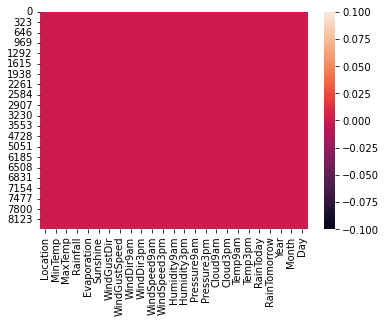

In [20]:
# Let's visualize the null values clearly through Heatmap
sns.heatmap(df.isnull())

From above, we can see that there are no more missing values in the dataset.

In [21]:
#Checking the unique values in each column
df.nunique().to_frame("Unique Values")

,Unique Values
Location,12
MinTemp,286
MaxTemp,332
Rainfall,250
Evaporation,116
Sunshine,141
WindGustDir,16
WindGustSpeed,52
WindDir9am,16
WindDir3pm,16


In [23]:
# Statistical summary of numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6762.0,13.109145,5.540667,-2.0,9.000000,13.109145,17.4,28.5
MaxTemp,6762.0,24.098345,6.130123,8.2,19.600000,23.500000,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.000000,0.000000,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.000000,4.600000,5.0,145.0
Sunshine,6762.0,7.890896,2.733639,0.0,7.890896,7.890896,9.2,13.9
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.000000,37.000000,46.0,107.0
WindSpeed9am,6762.0,12.765602,9.789075,0.0,6.000000,11.000000,19.0,63.0
WindSpeed3pm,6762.0,17.571150,9.548634,0.0,11.000000,17.000000,24.0,83.0
Humidity9am,6762.0,67.506559,17.182700,10.0,56.000000,68.000000,80.0,100.0
Humidity3pm,6762.0,50.467147,18.498341,6.0,38.000000,50.000000,62.0,99.0


From above statistical summery of the numerical data, we can see for few columns man, min and max value is nearly same.Skewness and Outliers present in the dataset and we will check and remove at later stage. 

## Data Visualisation

#### Univariate Analysis

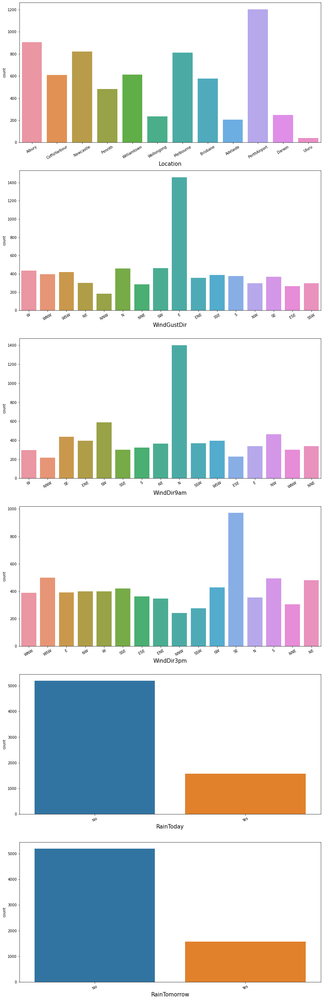

In [29]:
#Count plot of Catagorical column

plt.figure(figsize=(15,50), facecolor='white')
plotnumber = 1

for i in df[Catg_data]:
    if plotnumber<=6 :
        ax = plt.subplot(6,1,plotnumber)
        sns.countplot(df[i])
        plt.xlabel(i,fontsize=15)
        plt.xticks(rotation=30)
       
    plotnumber+=1
plt.show()

From the above count plot, we have following observations

•	Location PerthAirport has the most data and Uluru has the least data available

•	The strongest wind direction or (Wind gust speed) in a day range variedly and most of the data says E.

•	Morning Wind direction (9.00 am) shows North as the most in the dataset.

•	Evening wind direction (3.00 pm) shows Southeast as the most in the dataset.

•	Most of the time there is NO rain today and No Rain predicted for tomorrow.




#### Bivariate Analysis

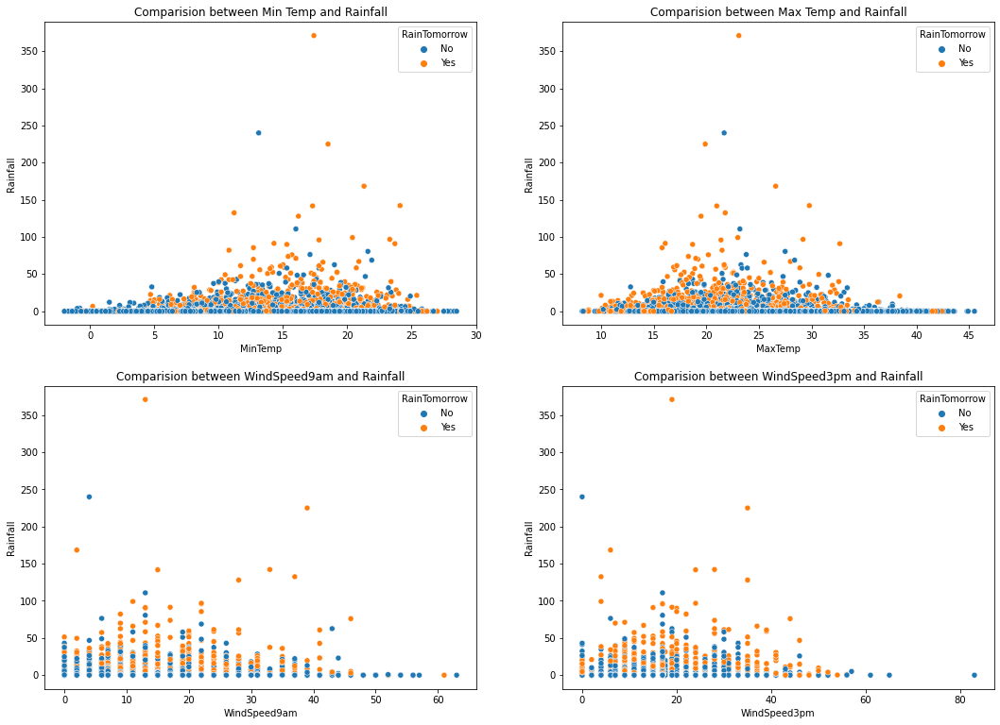

In [35]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between Min Temp and Rainfall')
sns.scatterplot(df['MinTemp'],df['Rainfall'],hue=df['RainTomorrow']);

plt.subplot(2,2,2)
plt.title('Comparision between Max Temp and Rainfall')
sns.scatterplot(df['MaxTemp'],df['Rainfall'],hue=df['RainTomorrow']);

plt.subplot(2,2,3)
plt.title('Comparision between WindSpeed9am and Rainfall')
sns.scatterplot(df['WindSpeed9am'],df['Rainfall'],hue=df['RainTomorrow']);

plt.subplot(2,2,4)
plt.title('Comparision between WindSpeed3pm and Rainfall')
sns.scatterplot(df['WindSpeed3pm'],df['Rainfall'],hue=df['RainTomorrow']);



High rain fall in temperature of 10 to 25

If the Maximum temperature is in between 15 to 30 then the rainfall is high

High rain fall during evapuration at 20 to 30, and chances of Raining Tomorrow is also high during same rate

If wind speed 0 to 40 at noon then chances of Rainfall is high

If in morning there is wind then chances rain is high

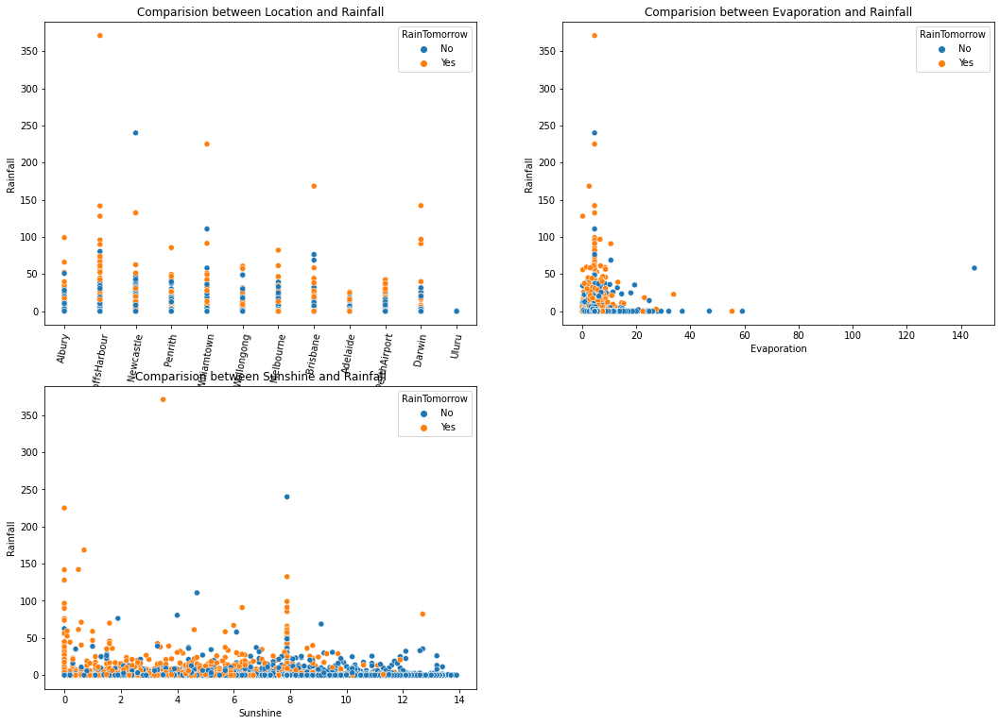

In [37]:
# Comparision between two variables
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between Location and Rainfall')
sns.scatterplot(df['Location'],df['Rainfall'],hue=df['RainTomorrow']);
plt.xticks(rotation=80)

plt.subplot(2,2,2)
plt.title('Comparision between Evaporation and Rainfall')
sns.scatterplot(df['Evaporation'],df['Rainfall'],hue=df['RainTomorrow']);

plt.subplot(2,2,3)
plt.title('Comparision between Sunshine and Rainfall')
sns.scatterplot(df['Sunshine'],df['Rainfall'],hue=df['RainTomorrow']);

From this we can notice that At coffsHarbour the rain fall is comparetevily high

As Sunshine increases rain fall decreases, but IF sunshine is very high some chances of rain fall is there

We can see that Evaporation and rainfall is correlated highly.

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

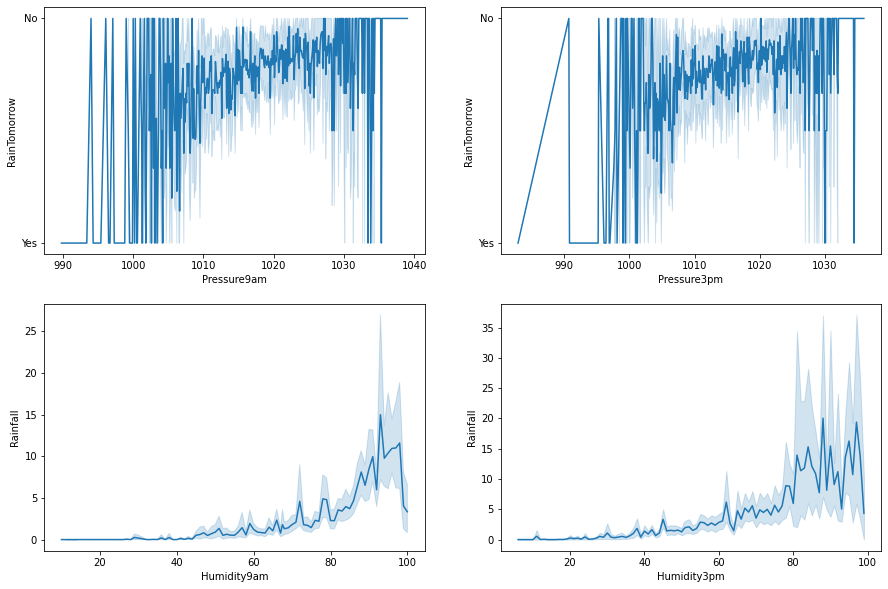

In [39]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Humidity9am and RainTomorrow
sns.lineplot(x='Pressure9am',y='RainTomorrow',ax=axes[0,0],data=df)

#checking the relation between Humidity3pm and RainTomorrow
sns.lineplot(x='Pressure3pm',y='RainTomorrow',ax=axes[0,1],data=df)

#checking the relation between Humidity9am and Rainfall
sns.lineplot(x='Humidity9am',y='Rainfall',ax=axes[1,0],data=df)

#checking the relation between Humidity3pm and Rainfall
sns.lineplot(x='Humidity3pm',y='Rainfall',ax=axes[1,1],data=df)

From Fig 1&2 we can notice that at pressure in between 1000 to 1030 chances of rain fall is high and From Fig 3&4 we can notice if high Humidity is there then chaces of rain fall is high 

<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

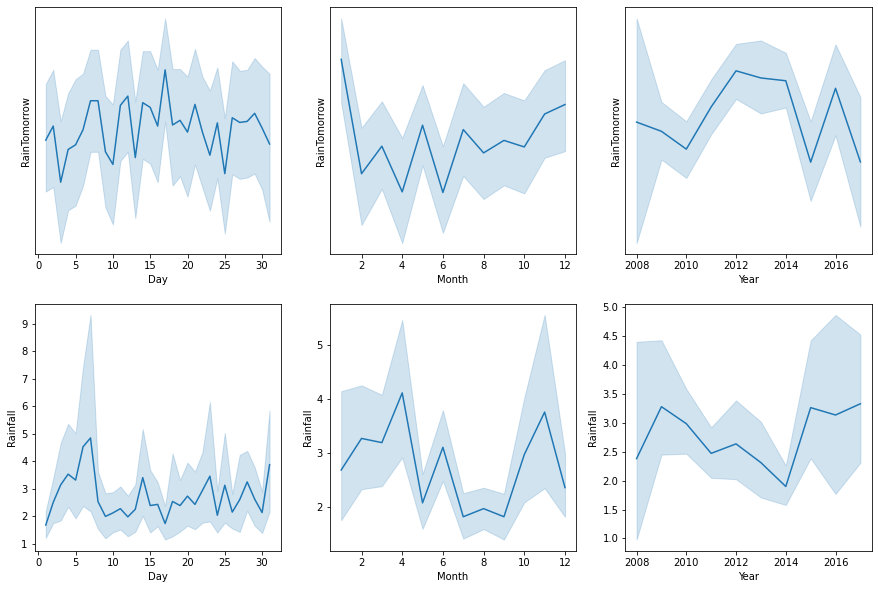

In [41]:
#lets check Day, month and Year with our targets.

fig,axes=plt.subplots(2,3,figsize=(15,10))

#checking the relation between Day and RainTomorrow
sns.lineplot(x='Day',y='RainTomorrow',ax=axes[0,0],data=df)

#checking the relation between Month and RainTomorrow
sns.lineplot(x='Month',y='RainTomorrow',ax=axes[0,1],data=df)

#checking the relation between Year and RainTomorrow
sns.lineplot(x='Year',y='RainTomorrow',ax=axes[0,2],data=df)

#checking the relation between Day and Rainfall
sns.lineplot(x='Day',y='Rainfall',ax=axes[1,0],data=df)

#checking the relation between Month and Rainfall
sns.lineplot(x='Month',y='Rainfall',ax=axes[1,1],data=df)

#checking the relation between Year and Rainfall
sns.lineplot(x='Year',y='Rainfall',ax=axes[1,2],data=df)

There is no specific pattern between Raintomorrow and day, month and year.
Although April, June and November has the highest Rainfall.

#### Multivariate Analysis

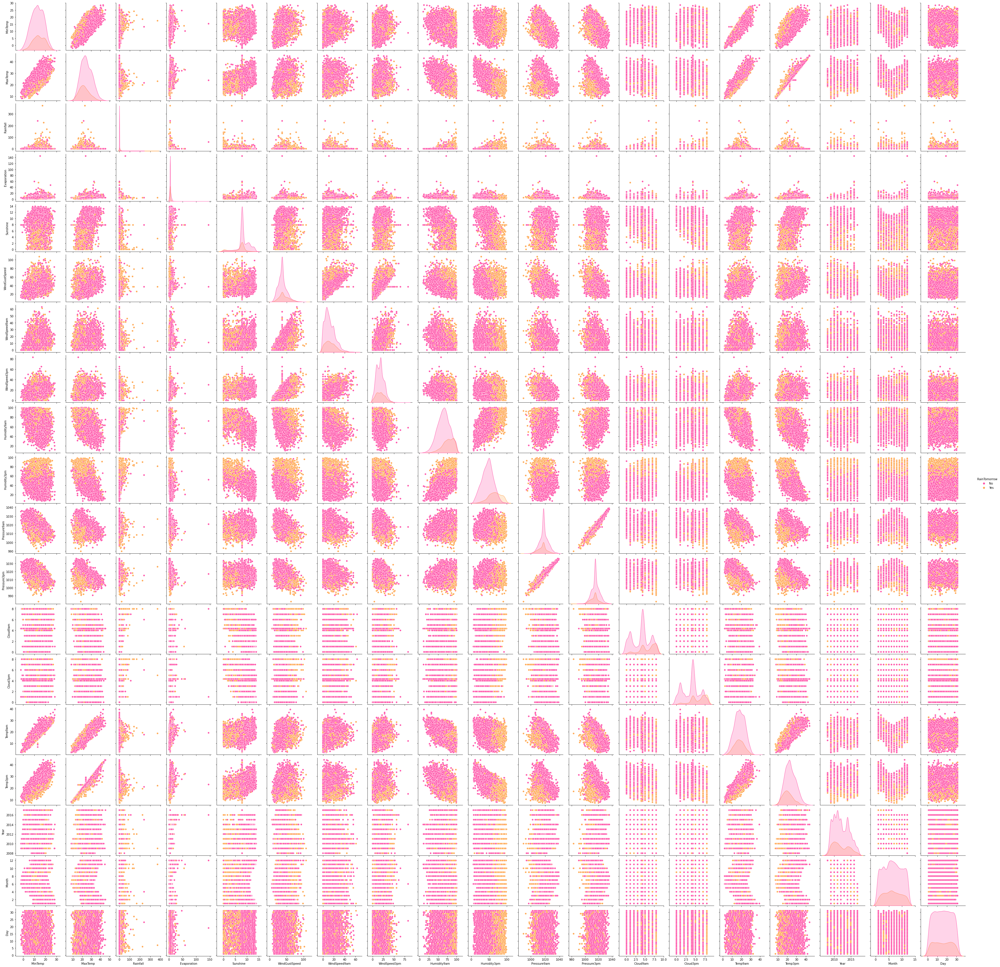

In [42]:
sns.pairplot(df,palette='spring',hue='RainTomorrow')
plt.show()

From the above pair plot we can observe high relation beteen Rainfall and RainTomorrow. We ill check multicollinearity issue later.

### Outliers

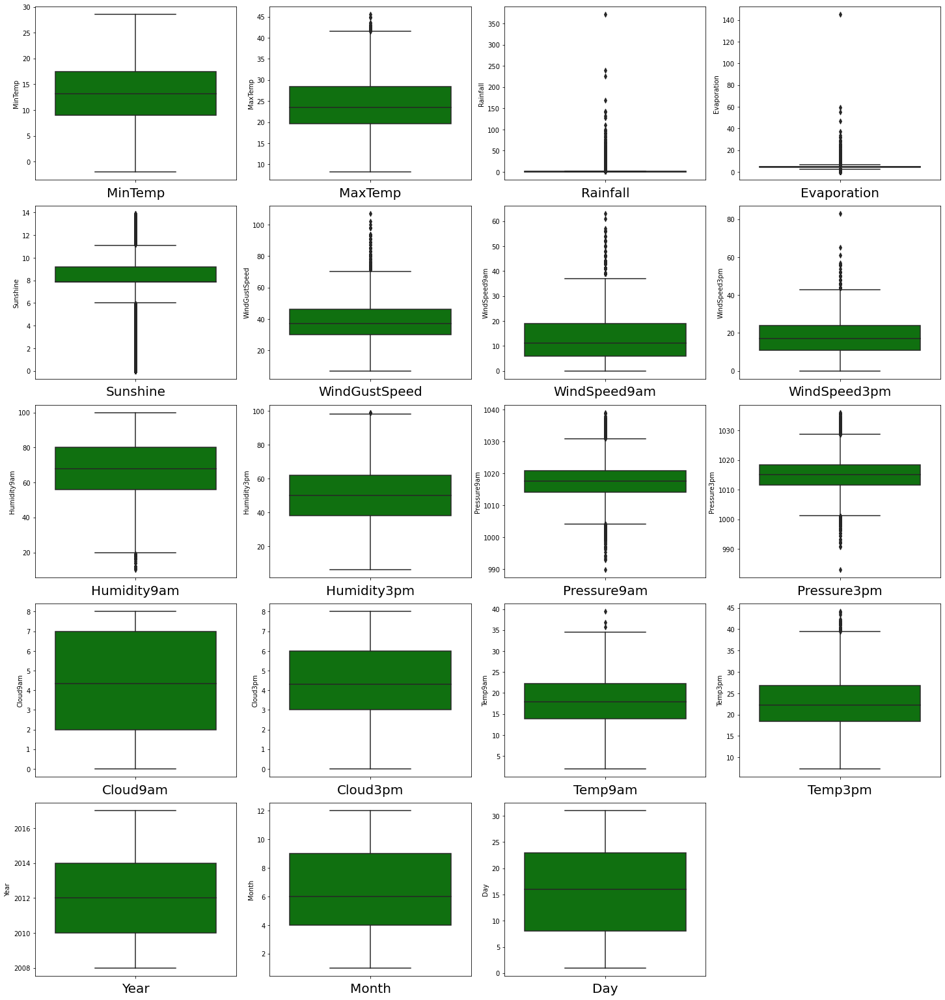

In [47]:
#Let's check the Outliers through Boxplot

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(y=column, data=df,color='g')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=1.0)
plt.show()

Most of the columns has Outliers. Let's remove them through ZScore method.

#### Removing outliers using Zscore

In [48]:
# Features containing outliers
df1 = df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

In [49]:
# Using zscore to remove outliers in the feature newpaper
from scipy.stats import zscore

z=np.abs(zscore(df1))

# Creating new dataframe
new_df=df[(z<3).all(axis=1)]
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.900000,0.6,4.6,7.890896,W,44.0,W,WNW,...,1007.1,8.000000,4.320988,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.100000,0.0,4.6,7.890896,WNW,44.0,NNW,WSW,...,1007.8,4.336806,4.320988,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.700000,0.0,4.6,7.890896,WSW,46.0,W,WSW,...,1008.7,4.336806,2.000000,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.000000,0.0,4.6,7.890896,NE,24.0,SE,E,...,1012.8,4.336806,4.320988,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.300000,1.0,4.6,7.890896,W,41.0,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,4.6,7.890896,E,31.0,SE,ENE,...,1020.3,4.336806,4.320988,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.300000,0.0,4.6,7.890896,NNW,22.0,SE,N,...,1019.1,4.336806,4.320988,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.900000,0.0,4.6,7.890896,N,37.0,SE,WNW,...,1016.8,4.336806,4.320988,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.000000,0.0,4.6,7.890896,SE,28.0,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [50]:
df.shape

(6762, 25)

In [51]:
new_df.shape

(6405, 25)

In [52]:
# Let's check the the data loss
data_loss = (6762-6405)/6762*100
data_loss

5.279503105590062

In [53]:
df=new_df.copy() # Reassigning the changed dataframe name to our original dataframe name

### Skewness

In [54]:
# Checking the skewness
df.skew()

MinTemp         -0.078085
MaxTemp          0.265247
Rainfall         3.520665
Evaporation      1.118992
Sunshine        -0.889339
WindGustSpeed    0.545596
WindSpeed9am     0.682369
WindSpeed3pm     0.341145
Humidity9am     -0.233594
Humidity3pm      0.156516
Pressure9am      0.063821
Pressure3pm      0.090219
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071465
Temp3pm          0.289057
Year             0.352952
Month            0.032796
Day              0.005249
dtype: float64

We can see skewness in Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am.

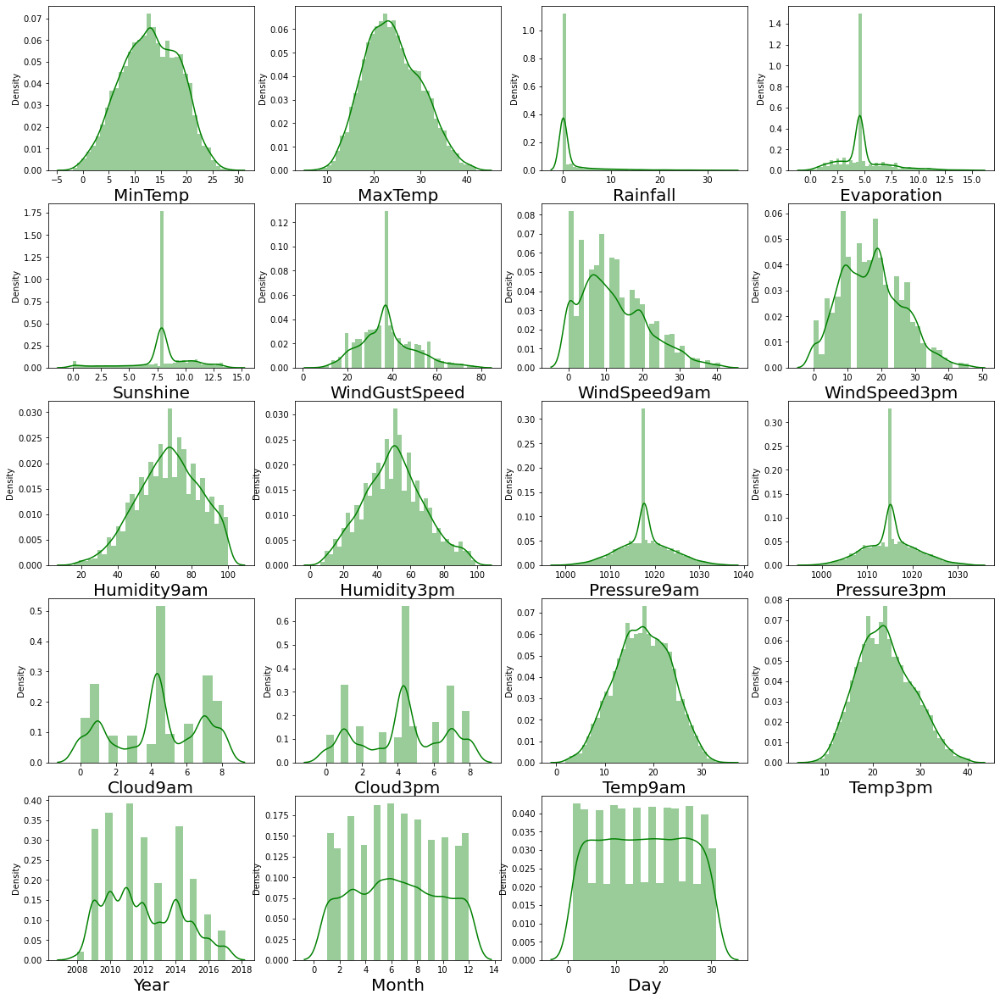

In [55]:
#Checking the skewness through Dist plot

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in Num_data:
    if plotnumber<=23:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color='g')
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

#### Removing skewness through yeo-johnson

In [56]:
# Removing skewness using yeo-johnson  method to get better prediction
skew = ["Rainfall", "Evaporation", "Sunshine", "WindGustSpeed", "WindSpeed9am"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [57]:
df[skew] = scaler.fit_transform(df[skew].values)
df[skew].head()

,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am
0,0.802149,0.019152,-0.119354,0.569368,0.907717
1,-0.646716,0.019152,-0.119354,0.569368,-0.856432
2,-0.646716,0.019152,-0.119354,0.717998,0.825275
3,-0.646716,0.019152,-0.119354,-1.169490,0.070417
4,1.165262,0.019152,-0.119354,0.339666,-0.408178


In [58]:
# Checking the skewness after power transform
df.skew()

MinTemp         -0.078085
MaxTemp          0.265247
Rainfall         1.065122
Evaporation      0.060615
Sunshine        -0.052438
WindGustSpeed    0.007574
WindSpeed9am    -0.130923
WindSpeed3pm     0.341145
Humidity9am     -0.233594
Humidity3pm      0.156516
Pressure9am      0.063821
Pressure3pm      0.090219
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071465
Temp3pm          0.289057
Year             0.352952
Month            0.032796
Day              0.005249
dtype: float64

Still 'Rainfall' has skewness. Let's remove it further through square root method

In [59]:
# Removing skewness using square root method
df["Rainfall"] = np.cbrt(df["Rainfall"])

In [60]:
# Checking the skewness after power transform
df.skew()

MinTemp         -0.078085
MaxTemp          0.265247
Rainfall         0.831206
Evaporation      0.060615
Sunshine        -0.052438
WindGustSpeed    0.007574
WindSpeed9am    -0.130923
WindSpeed3pm     0.341145
Humidity9am     -0.233594
Humidity3pm      0.156516
Pressure9am      0.063821
Pressure3pm      0.090219
Cloud9am        -0.203078
Cloud3pm        -0.146885
Temp9am         -0.071465
Temp3pm          0.289057
Year             0.352952
Month            0.032796
Day              0.005249
dtype: float64

We have removed skewness maximum possible.

### Encoding

##### Encoing Catagorical data using Label Encoding

In [61]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df[Catg_data]= df[Catg_data].apply(le.fit_transform)

In [62]:
df[Catg_data]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,1,13,13,14,0,0
1,1,14,6,15,0,0
2,1,15,13,15,0,0
3,1,4,9,0,0,0
4,1,13,1,7,0,0
...,...,...,...,...,...,...
8420,9,0,9,1,0,0
8421,9,6,9,3,0,0
8422,9,3,9,14,0,0
8423,9,9,10,3,0,0


### Correlation

In [63]:
# Checking the correlation between features and the target
cor = df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.091711,0.073299,0.002914,0.109779,0.061001,-0.086740,0.279286,-0.102867,-0.000110,...,-0.018051,-0.005569,-0.004753,0.098788,0.069448,-0.004064,0.001047,0.504642,-0.070775,-0.004824
MinTemp,0.091711,1.000000,0.730442,0.058443,0.385046,0.080219,-0.142466,0.261437,-0.021335,-0.143475,...,-0.447598,0.094939,0.044612,0.892858,0.699452,0.072284,0.092327,0.034034,-0.235969,0.018313
MaxTemp,0.073299,0.730442,1.000000,-0.259566,0.488796,0.383134,-0.203165,0.185073,-0.193005,-0.165229,...,-0.426090,-0.240464,-0.239200,0.865475,0.974864,-0.219817,-0.158562,0.084322,-0.172557,0.019849
Rainfall,0.002914,0.058443,-0.259566,1.000000,-0.220591,-0.285145,0.112833,0.052346,0.150745,0.116489,...,-0.022578,0.320144,0.283802,-0.119979,-0.270574,0.855693,0.319263,0.013968,-0.007286,-0.010774
Evaporation,0.109779,0.385046,0.488796,-0.220591,1.000000,0.444145,-0.121925,0.210866,-0.113451,-0.028743,...,-0.306963,-0.132476,-0.176777,0.455846,0.475868,-0.184877,-0.111478,0.092125,-0.041669,0.007102
Sunshine,0.061001,0.080219,0.383134,-0.285145,0.444145,1.000000,-0.095693,0.067975,-0.083972,-0.059004,...,-0.101650,-0.551004,-0.571720,0.281522,0.399880,-0.240779,-0.328343,0.020582,0.002198,-0.000700
WindGustDir,-0.086740,-0.142466,-0.203165,0.112833,-0.121925,-0.095693,1.000000,0.012212,0.381934,0.456003,...,-0.007179,0.113068,0.073411,-0.158286,-0.213889,0.108370,0.033716,-0.184168,0.032303,0.016802
WindGustSpeed,0.279286,0.261437,0.185073,0.052346,0.210866,0.067975,0.012212,1.000000,-0.059508,0.096841,...,-0.322810,-0.002761,0.033630,0.245915,0.153355,0.077832,0.155732,-0.020092,0.049537,-0.003684
WindDir9am,-0.102867,-0.021335,-0.193005,0.150745,-0.113451,-0.083972,0.381934,-0.059508,1.000000,0.207862,...,0.057946,0.070301,0.053819,-0.067002,-0.201683,0.149877,0.034460,-0.082950,0.020991,-0.007582
WindDir3pm,-0.000110,-0.143475,-0.165229,0.116489,-0.028743,-0.059004,0.456003,0.096841,0.207862,1.000000,...,-0.041406,0.069949,0.048944,-0.150268,-0.176486,0.095332,-0.000168,0.005258,0.029916,0.001450


Positive correlation - A correlation of +1 indicates a perfect positive correlation, meaning that both variables move in the same direction together.

Negative correlation - A correlation of –1 indicates a perfect negative correlation, meaning that as one variable goes up, the other goes down.

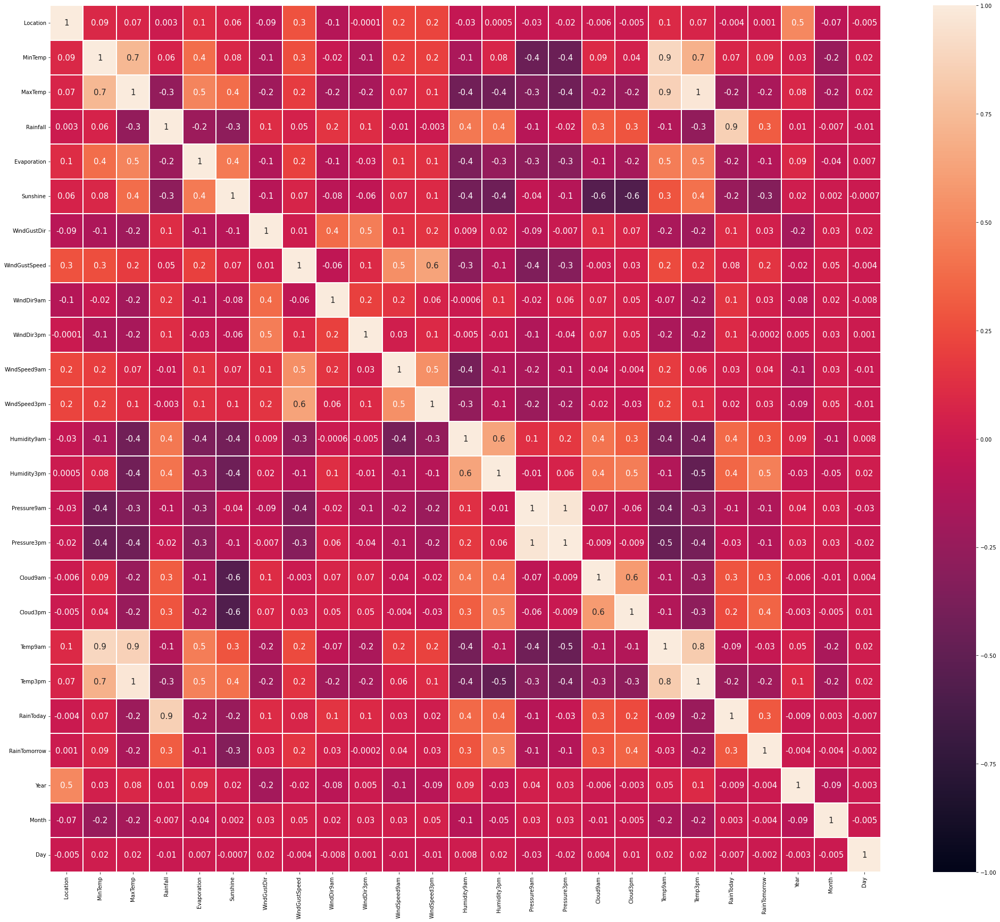

In [64]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(35,30))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, annot_kws={'size':15})
plt.yticks(rotation=0);

From the above heatmap,  we can see multi colinearity between some features, so we will use VIF techniques to remove highly related feature

##### Visualizing the correlation between label and features using bar plot

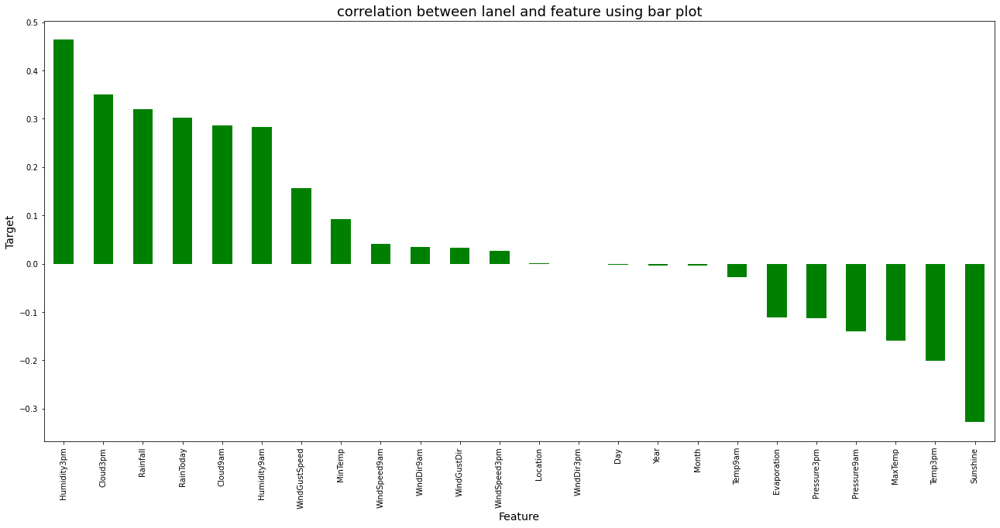

In [65]:
plt.figure(figsize=(22,10))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()

From above bar plot with Target, we can see 'WindDir3pm' has no relation with our target variable. Day, Year and Month has almost no relation with Target. Sunshine has high negative relation. 

### Separating the independent and target variables into x and y

In [66]:
x = df.drop("RainTomorrow", axis=1)
y = df["RainTomorrow"]

In [67]:
y.value_counts()

0    4978
1    1427
Name: RainTomorrow, dtype: int64

As the target variable is imbalanced, let's balance it through Oversampling method

### Oversampling

In [68]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [69]:
y.value_counts()

0    4978
1    4978
Name: RainTomorrow, dtype: int64

Our Target vaiable is now balanced.

### Scaling data with standard scaler

In [71]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.406537,0.008855,-0.080580,1.040900,0.113347,0.10357,1.273018,0.490954,1.365498,1.466606,...,-1.714567,-1.402471,1.361377,-0.220199,-0.146320,-0.013585,-0.582763,-1.7593,1.796427,-1.660273
1,-1.406537,-1.103169,0.293651,-0.883174,0.113347,0.10357,1.471810,0.490954,-0.231459,1.699936,...,-1.197088,-1.276675,-0.184777,-0.220199,-0.091956,0.420580,-0.582763,-1.7593,1.796427,-1.545335
2,-1.406537,-0.083813,0.395714,-0.883174,0.113347,0.10357,1.670601,0.642053,1.365498,1.699936,...,-1.732411,-1.114938,-0.184777,-1.258598,0.596654,0.229547,-0.582763,-1.7593,1.796427,-1.430397
3,-1.406537,-0.769562,0.786956,-0.883174,0.113347,0.10357,-0.516108,-1.276797,0.452951,-1.800008,...,0.052000,-0.378135,-0.184777,-0.220199,0.071136,0.802645,-0.582763,-1.7593,1.796427,-1.315459
4,-1.406537,0.768738,1.518408,1.172990,0.113347,0.10357,1.273018,0.257435,-1.372143,-0.166701,...,-1.161400,-1.600149,0.939299,1.425773,0.016772,1.358376,-0.582763,-1.7593,1.796427,-1.200521


This is our scaled data using standard scaler.

### Variance Inflation Factor(VIF)

In [72]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.652508,Location
1,10.257843,MinTemp
2,24.940670,MaxTemp
3,3.165798,Rainfall
4,1.673723,Evaporation
5,2.157891,Sunshine
6,1.536949,WindGustDir
7,2.213181,WindGustSpeed
8,1.392887,WindDir9am
9,1.418132,WindDir3pm


We can observe some columns have VIF above 10 that means they are causing multicollinearity problem. Let's drop the coloumn with maximum value first.

In [73]:
# Dropping Temp3pm column as it contains high VIF value
x.drop(["Temp3pm"],axis=1,inplace=True)

In [74]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,1.652041,Location
1,10.216081,MinTemp
2,10.077839,MaxTemp
3,3.162978,Rainfall
4,1.673616,Evaporation
5,2.157310,Sunshine
6,1.531138,WindGustDir
7,2.204141,WindGustSpeed
8,1.390584,WindDir9am
9,1.416929,WindDir3pm


In [75]:
# Dropping Pressure9am column as it contains high VIF value
x.drop(["Pressure9am"],axis=1,inplace=True)

In [76]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,1.650256,Location
1,10.121840,MinTemp
2,9.742646,MaxTemp
3,3.152698,Rainfall
4,1.658779,Evaporation
5,2.151443,Sunshine
6,1.519263,WindGustDir
7,2.181835,WindGustSpeed
8,1.361019,WindDir9am
9,1.335858,WindDir3pm


In [77]:
# Dropping Temp9am column as it contains high VIF value
x.drop(["Temp9am"],axis=1,inplace=True)

In [78]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(x.values, i) 
                     for i in range(x.shape[1])]
vif["Features"]=x.columns
vif

,vif_Features,Features
0,1.647521,Location
1,5.022615,MinTemp
2,5.869768,MaxTemp
3,3.151615,Rainfall
4,1.649383,Evaporation
5,2.129628,Sunshine
6,1.517520,WindGustDir
7,2.149087,WindGustSpeed
8,1.359233,WindDir9am
9,1.335505,WindDir3pm


Now the VIF value is less than 10 for all columns, so there is no multicollinireaty issue. We can now proceede for modelling.

## Modeling

#### Finding best random state

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [80]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9136257114161366  on Random_state  124


Here we are getting accuracy score of 91.36% with Random state 124

Now splitting the data for Training and Testing purpose. 70% we are considering for Training and 30% for Testing purpose

In [81]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

### Random Forest Classifier

In [82]:
# Checking accuracy score for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)

print(accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.9136257114161366
[[1363  135]
 [ 123 1366]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.91      1498
           1       0.91      0.92      0.91      1489

    accuracy                           0.91      2987
   macro avg       0.91      0.91      0.91      2987
weighted avg       0.91      0.91      0.91      2987



### Support Vector Machine Classifier

In [83]:
# Checking accuracy score for Support Vector Machine Classifier
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)

print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.871108135252762
[[1299  199]
 [ 186 1303]]
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      1498
           1       0.87      0.88      0.87      1489

    accuracy                           0.87      2987
   macro avg       0.87      0.87      0.87      2987
weighted avg       0.87      0.87      0.87      2987



### Gradient Boosting Classifier

In [84]:
# Checking accuracy score for Gradient Boosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

print(accuracy_score(y_test, predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

0.879142952795447
[[1339  159]
 [ 202 1287]]
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      1498
           1       0.89      0.86      0.88      1489

    accuracy                           0.88      2987
   macro avg       0.88      0.88      0.88      2987
weighted avg       0.88      0.88      0.88      2987



### Bagging Classifier

In [85]:
# Checking accuracy for BaggingClassifier
BC = BaggingClassifier()
BC.fit(x_train,y_train)

# Prediction
predBC = BC.predict(x_test)

print(accuracy_score(y_test, predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test,predBC))

0.8865082022095748
[[1340  158]
 [ 181 1308]]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1498
           1       0.89      0.88      0.89      1489

    accuracy                           0.89      2987
   macro avg       0.89      0.89      0.89      2987
weighted avg       0.89      0.89      0.89      2987



### XGB Classifier

In [86]:
# Checking accuracy for XGBClassifier
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)

# Prediction
predXGB = XGB.predict(x_test)

print(accuracy_score(y_test, predXGB))
print(confusion_matrix(y_test, predXGB))
print(classification_report(y_test,predXGB))

0.9119517910947439
[[1388  110]
 [ 153 1336]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.91      1498
           1       0.92      0.90      0.91      1489

    accuracy                           0.91      2987
   macro avg       0.91      0.91      0.91      2987
weighted avg       0.91      0.91      0.91      2987



#### Checking the cross validation score

In [87]:
from sklearn.model_selection import cross_val_score

In [88]:
# cv score for Random Forest Classifier
print(cross_val_score(RFC,x,y,cv=5).mean())

0.7086282346866118


In [89]:
# cv score for Support Vector  Classifier
print(cross_val_score(svc,x,y,cv=5).mean())

0.7094272620365943


In [90]:
# cv score for Gradient Boosting Classifier
print(cross_val_score(GB,x,y,cv=5).mean())

0.6575012253937901


In [91]:
# cv score for Bagging Classifier
print(cross_val_score(BC,x,y,cv=5).mean())

0.6923621658910882


In [92]:
# cv score for XGB Classifier
print(cross_val_score(XGB,x,y,cv=5).mean())

0.6203418899102185


From the above observation, looking at the accuracy score and the cross validation score we conclude that Support Vector Classifier is our best fitting model

### Hyper Parameter Tuning

In [94]:
from sklearn.model_selection import GridSearchCV

In [95]:
#Suppot Vector Classifier
parameters={'C':[1,0.5,1.5],
       'kernel' : ['linear', 'poly', 'rbf'],
        'gamma' : ['scale', 'auto'],
        'random_state':[100,200,150,250]}


In [96]:
GCV=GridSearchCV(SVC(),parameters,cv=5)

In [97]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [1, 0.5, 1.5], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf'],
                         'random_state': [100, 200, 150, 250]})

In [98]:
GCV.best_params_

{'C': 1.5, 'gamma': 'scale', 'kernel': 'rbf', 'random_state': 100}

In [99]:
Final_Model = SVC(C= 1.5, gamma='scale', kernel= 'rbf', random_state=100)
Final_Model.fit(x_train, y_train)
pred = Final_Model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

87.74690324740543


After Hyperparameter Tuning, accuracy score is 87.74%

### Plotting ROC-AUC curve

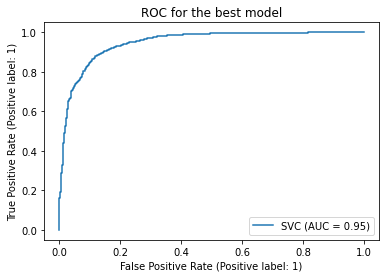

In [100]:
# Let's check the Auc for the best model after hyper parameter tuning
from sklearn.metrics import plot_roc_curve 

plot_roc_curve(Final_Model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

Here I have generated the ROC Curve for final model and it shows the AUC score for my final model 95%

## Saving The Model - RainTomorrow (Classification)

In [101]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model,"Rainfall Prediction_RainTomorrow.pkl")

['Rainfall Prediction_RainTomorrow.pkl']

#### Predicting the saved model

In [102]:
# Loading the saved model
model_RainTomorrow=joblib.load("Rainfall Prediction_RainTomorrow.pkl")

#Prediction
prediction = model_RainTomorrow.predict(x_test)
a = np.array(y_test)
df_RainTomorrow = pd.DataFrame({"Original":a,"Predicted":prediction},index=range(len(a)))
df_RainTomorrow

,Original,Predicted
0,0,0
1,1,1
2,0,0
3,0,0
4,1,1
...,...,...
2982,1,1
2983,0,0
2984,0,1
2985,1,1


Here we have predicted the RainTomorrow using CLassification

# Prediction for Rainfall

<AxesSubplot:>

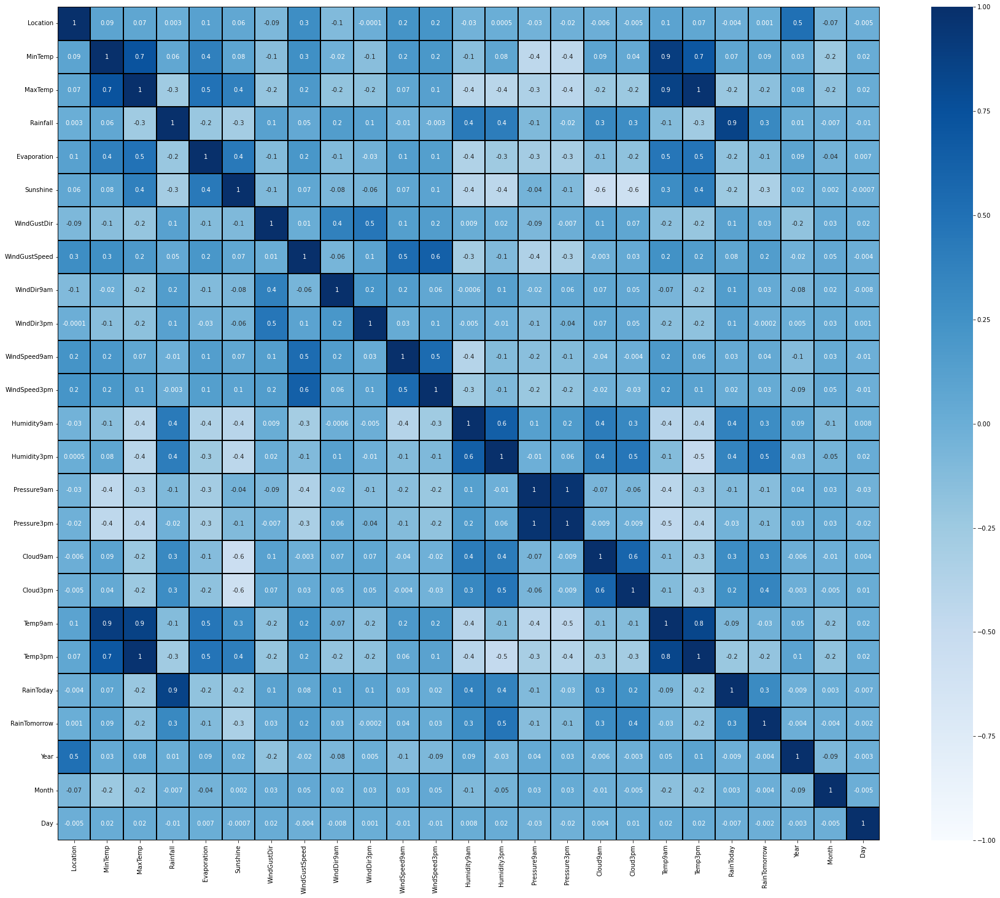

In [103]:
#Finding relation ith Rainfall
plt.figure(figsize=(30,25))
sns.heatmap(cor,linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="Blues")

#### Visualizing the correlation between label and features using bar plot

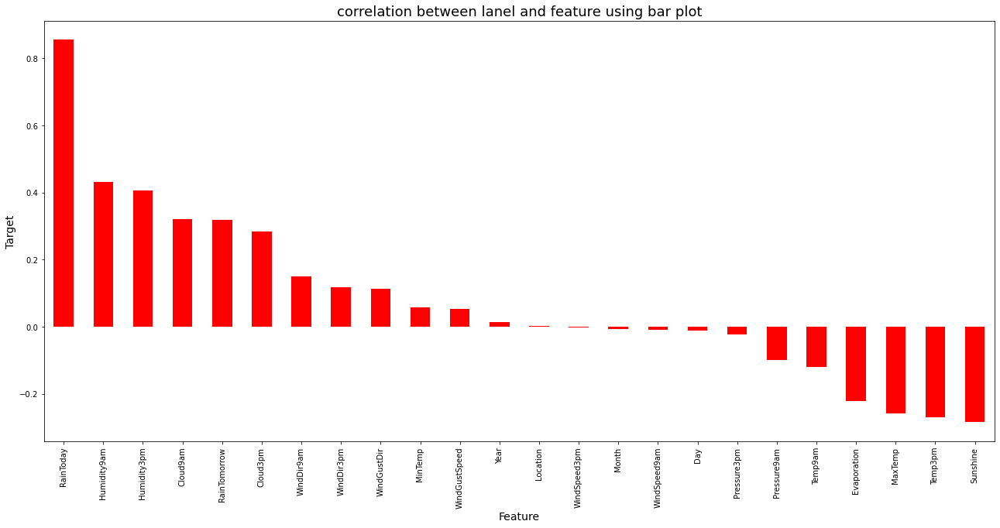

In [104]:
plt.figure(figsize=(22,10))
df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='r')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between lanel and feature using bar plot',fontsize=18)
plt.show()

From above bar plot, Location, WindSpeed3pm has very less relation with our Target.

#### Separating the independent and target variables into X and Y

In [107]:
X = df.drop("Rainfall", axis=1)
Y = df["Rainfall"]

#### Scaling data with standard scaler

In [108]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,-1.39139,0.069957,-0.190477,0.019152,-0.119354,1.222871,0.569368,1.317529,1.373286,0.907717,...,-1.437564,1.496298,0.018004,-0.162089,-0.149397,-0.535408,-0.535408,-1.770823,1.65618,-1.671766
1,-1.39139,-1.013228,0.174724,0.019152,-0.119354,1.413823,0.569368,-0.222754,1.596561,-0.856432,...,-1.314041,0.014970,0.018004,-0.109335,0.276729,-0.535408,-0.535408,-1.770823,1.65618,-1.558010
2,-1.39139,-0.020308,0.274325,0.019152,-0.119354,1.604776,0.717998,1.317529,1.596561,0.825275,...,-1.155224,0.014970,-0.982944,0.558889,0.089233,-0.535408,-0.535408,-1.770823,1.65618,-1.444253
3,-1.39139,-0.688272,0.656126,0.019152,-0.119354,-0.495701,-1.169490,0.437367,-1.752556,0.070417,...,-0.431729,0.014970,0.018004,0.048929,0.651720,-0.535408,-0.535408,-1.770823,1.65618,-1.330497
4,-1.39139,0.810134,1.369930,0.019152,-0.119354,1.222871,0.339666,-1.322957,-0.189635,-0.408178,...,-1.631673,1.091917,1.604613,-0.003826,1.197162,-0.535408,-0.535408,-1.770823,1.65618,-1.216740


### Variance Inflation Factor(VIF)

In [109]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,1.662063,Location
1,9.237316,MinTemp
2,26.290924,MaxTemp
3,1.685714,Evaporation
4,2.197572,Sunshine
5,1.581455,WindGustDir
6,2.330526,WindGustSpeed
7,1.347851,WindDir9am
8,1.424537,WindDir3pm
9,2.033573,WindSpeed9am


In [111]:
# Dropping Temp3pm column as it contains high VIF value
X.drop(["Temp3pm"],axis=1,inplace=True)

In [112]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,1.661972,Location
1,9.194069,MinTemp
2,9.667177,MaxTemp
3,1.685352,Evaporation
4,2.197570,Sunshine
5,1.576704,WindGustDir
6,2.323372,WindGustSpeed
7,1.346419,WindDir9am
8,1.423983,WindDir3pm
9,2.033080,WindSpeed9am


In [113]:
# Dropping Pressure9am column as it contains high VIF value
X.drop(["Pressure9am"],axis=1,inplace=True)

In [114]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,1.659865,Location
1,9.100891,MinTemp
2,9.313921,MaxTemp
3,1.669140,Evaporation
4,2.183746,Sunshine
5,1.563728,WindGustDir
6,2.299920,WindGustSpeed
7,1.322097,WindDir9am
8,1.352881,WindDir3pm
9,2.027437,WindSpeed9am


In [115]:
# Dropping Temp9am column as it contains high VIF value
X.drop(["Temp9am"],axis=1,inplace=True)

In [116]:
# Again checking VIF value to confirm whether the multicollinearity still exists or not

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,1.657399,Location
1,4.791330,MinTemp
2,5.617634,MaxTemp
3,1.658199,Evaporation
4,2.158311,Sunshine
5,1.561474,WindGustDir
6,2.266877,WindGustSpeed
7,1.320925,WindDir9am
8,1.352757,WindDir3pm
9,2.006603,WindSpeed9am


Now the VIF value is less than 10 for all columns, so there is no multicollinireaty issue. We can now proceede for modelling.

## Modeling

### Finding best random state

### Applying Regression Algorithms

In [118]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [120]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.7899225469479456  on Random_state  61


So, here we are getting the maximum r2 score as 78.99% on the random state 61.

Now splitting the data for Training and Testing purpose. 70% we are considering for Training and 30% for Testing purpose

### Random Forest Regressor

In [121]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('Mean abs error:',mean_absolute_error(y_test, predRFR))
print('Mean squared error:',mean_squared_error(y_test, predRFR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predRFR)))

# Checking cv score for Random Forest Regression
print("The CV  score for  the Random forest regressor is:",cross_val_score(RFR,X,Y,cv=5).mean())

R2_Score: 0.7452014926582224
Mean abs error: 0.2644319061054627
Mean squared error: 0.21240359037413195
Root Mean squared error(RMSE): 0.46087264007980766
The CV  score for  the Random forest regressor is: 0.7379859117968401


### Decision Tree Regressor

In [122]:
# Checking R2 score for Decision Tree Regressor
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)

# prediction
predDTR=DTR.predict(x_test)
print('R2_Score:',r2_score(y_test,predDTR))
print('Mean abs error:',mean_absolute_error(y_test, predDTR))
print('Mean squared error:',mean_squared_error(y_test, predDTR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predDTR)))

# Checking cv score for Decision Tree Regression
print('The CV score  for  the Decision Tree Regression is :',cross_val_score(DTR,X,Y,cv=5).mean())

R2_Score: 0.5284972822591838
Mean abs error: 0.26709064837894475
Mean squared error: 0.39305124336923297
Root Mean squared error(RMSE): 0.626937990051036
The CV score  for  the Decision Tree Regression is : 0.41420233091357606


### KNNeighbors Regressor

In [123]:
# Checking R2 score for KNN Regressor
knn=KNN()
knn.fit(x_train,y_train)

# prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('Mean abs error:',mean_absolute_error(y_test, predknn))
print('Mean squared error:',mean_squared_error(y_test, predknn))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predknn)))

# Checking cv score for Decision Tree Regression
print('The CV score  for  the Decision Tree Regression is :',cross_val_score(knn,X,Y,cv=5).mean())

R2_Score: 0.6635521394369611
Mean abs error: 0.29672860863905226
Mean squared error: 0.2804676302967005
Root Mean squared error(RMSE): 0.5295919469711567
The CV score  for  the Decision Tree Regression is : 0.6920740328761017


### Gradient Boosting Regressor

In [124]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)

#prediction
predGBR=GBR.predict(x_test)
print('R2_Score:',r2_score(y_test,predGBR))
print('Mean abs error:',mean_absolute_error(y_test, predGBR))
print('Mean squared error:',mean_squared_error(y_test, predGBR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predGBR)))

# Checking cv score for GBR Regression
print('The  CV score for the GradientBoosting  regressor is :',cross_val_score(GBR,X,Y,cv=6).mean())

R2_Score: 0.7469400843969176
Mean abs error: 0.2651768764533138
Mean squared error: 0.210954276045935
Root Mean squared error(RMSE): 0.4592975898542632
The  CV score for the GradientBoosting  regressor is : 0.7528301454718477


### Bagging Regressor

In [125]:
BR=BaggingRegressor()
BR.fit(x_train,y_train)

#prediction
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))
print('Mean abs error:',mean_absolute_error(y_test, predBR))
print('Mean squared error:',mean_squared_error(y_test, predBR))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predBR)))

# Checking cv score for Bagging Regression
print('The  CV score for the Bagging  regressor is :',cross_val_score(BR,X,Y,cv=5).mean())

R2_Score: 0.7243931606497096
Mean abs error: 0.26705460672478676
Mean squared error: 0.22974970623020569
Root Mean squared error(RMSE): 0.47932213200540374
The  CV score for the Bagging  regressor is : 0.7123079913583078


### XGB Regressor

In [126]:
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train,y_train)

#prediction
predXGB=XGB.predict(x_test)
print('R2_Score:',r2_score(y_test,predXGB))
print('Mean abs error:',mean_absolute_error(y_test, predXGB))
print('Mean squared error:',mean_squared_error(y_test, predXGB))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, predXGB)))

# Checking cv score for Extra Tree Regression
print('The  CV score for the Extra Tree  regressor is :',cross_val_score(XGB,X,Y,cv=6).mean())

R2_Score: 0.707601118020794
Mean abs error: 0.2981168459813769
Mean squared error: 0.2437477872288236
Root Mean squared error(RMSE): 0.49370820048772085
The  CV score for the Extra Tree  regressor is : 0.7048697423315388


From the above observation, looking at the difference of R2 score and the cross validation score we conclude that XGB Regressor is our best fitting model

## Hyperparameter tuning

In [127]:
from sklearn.model_selection import GridSearchCV

In [128]:
#XGB Regressor
parameters = {'n_estimators' : [50,100,200,400],
              'gamma' : np.arange(0,0.5,0.1),
              'max_depth' : [4, 6, 8,10],
              'n_jobs' : [-2, -1, 1]}


In [129]:
GCV=GridSearchCV(xgb(),parameters,cv=5)

In [130]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    gamma=None, gpu_id=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bin=None,
                                    max_cat...elta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                   

In [131]:
GCV.best_params_

{'gamma': 0.4, 'max_depth': 4, 'n_estimators': 50, 'n_jobs': -2}

In [132]:
Finalmodel = xgb(gamma=0.4, max_depth=4, n_estimators=50, n_jobs=-2)
Finalmodel.fit(x_train, y_train)
pred_GCV = Finalmodel.predict(x_test)
print('R2_Score:',r2_score(y_test,pred_GCV)*100)
print('Mean abs error:',mean_absolute_error(y_test, pred_GCV))
print('Mean squared error:',mean_squared_error(y_test, pred_GCV))
print('Root Mean squared error(RMSE):',np.sqrt(mean_squared_error(y_test, pred_GCV)))

R2_Score: 74.13672064901694
Mean abs error: 0.27105912854360087
Mean squared error: 0.2155999048153462
Root Mean squared error(RMSE): 0.4643273681524127


After Hyperparameter tuning R2 score of our best model is 74.13%

## Saving the model - Rainfall (Regression)

In [134]:
# Saving the model using .pkl
import joblib
joblib.dump(Finalmodel,"Rainfall Prediction.pkl")

['Rainfall Prediction.pkl']

In [135]:
# Loading the saved model
import joblib
Model=joblib.load("Rainfall Prediction.pkl")

#Prediction
prediction = Model.predict(x_test)
prediction

array([-0.70708567, -0.7496585 , -0.34869954, ..., -0.69908255,
       -0.7590523 , -0.75138074], dtype=float32)

In [136]:
pd.DataFrame([Model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,-0.707086,-0.864778
1,-0.749659,-0.864778
2,-0.348700,-0.864778
3,-0.681221,-0.864778
4,1.431181,1.237887
...,...,...
1917,-0.769510,-0.864778
1918,-0.855286,-0.864778
1919,-0.699083,-0.864778
1920,-0.759052,-0.864778


Above are the Predicted and Original value.

# Thank You !